<a href="https://colab.research.google.com/github/Kamyar-V2/RDW/blob/main/RDW_on_the_fly_image_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**On the fly image anlysis in microscopy**

* Reward-Driven analysis
* Benchmarching LoG* vs DCNN
* Effects of Sliding Window on Optimized Parameter Map
* Operation time benchmark
* Weakly supervised defect identification
* Real-time analysis and human in the loop control

September, 2024

Notebook prepared by **Kamyar Barakati**

Nural network developed by Maxim Ziatdinov in AtomAI Python library

Install packages

In [ ]:
! pip install git+https://github.com/pycroscopy/atomai # install the latest version from source

In [ ]:
! pip install platypus-opt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 8.1 MB/s eta 0:00:00


In [ ]:
! pip install scikit-optimize scipy numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 8.3 MB/s eta 0:00:00


Import libraries

In [ ]:
import atomai as aoi
from atomai.transforms import datatransform
from platypus import Problem, Real, NSGAII, Solution, Integer
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage import feature, io
from skimage import filters, img_as_float
from sklearn.neighbors import NearestNeighbors
import random
import math
import cv2
import time
import pickle
from scipy.stats import gaussian_kde
from matplotlib.ticker import FuncFormatter
import plotly.graph_objs as go
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture

# Download:

- Experiemental graphene data
- Experiemental graphene stack of images
- DCNN weights from atomai

In [ ]:
# download data
!gdown "https://drive.google.com/uc?id=18U8YHZUbSZj0Q1__zup5-ABrjaEZmiPc"
# download model
!gdown "https://drive.google.com/uc?id=18PQs7M_fBp4Lf0JVQlORERmBmYRJ88-M"
# download DCNN weights Graphene
!gdown 1SYEhCvo2-Bdv37Od0VZohurlnm3LSWCB
#Hexagonal train/test dataset
!wget -O "Hex_train_test3.npz" https://www.dropbox.com/s/aldxrawcf88btkc/Hex_train_test3.npz?dl=0

Hex_train_test3.npz 100%[===================>]   1.56G  91.3MB/s    in 19s     

2024-09-15 14:46:37 (86.3 MB/s) - ‘Hex_train_test3.npz’ saved [1677722602/1677722602]



In [ ]:
model = aoi.load_model("G_MD.tar")

/usr/local/lib/python3.10/dist-packages/atomai/models/loaders.py:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_dict = torch.load(filepath, map_location=device)


In [ ]:
exp_img = np.load("/content/Gr_SiCr.npy")

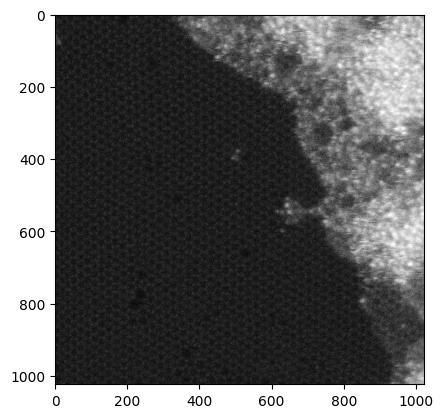

In [ ]:
plt.imshow(exp_img, cmap="gray")

#RDW test on pre aquired data

In [ ]:
def apply_gaussian_smoothing(image, sigma):

    # Convert the image to float to prevent data type overflow
    image_float = img_as_float(image)

    # Apply Gaussian filter
    smoothed_image = filters.gaussian(image_float, sigma=sigma)

    return smoothed_image

In [ ]:
# min-max normalization:
def norm2d(img: np.ndarray) -> np.ndarray:
    return (img - np.min(img)) / (np.max(img) - np.min(img))

## DCNN performance

Define image

In [ ]:
test_img = exp_img[0:128,0:128]

In [ ]:
test_img = apply_gaussian_smoothing(test_img, 0)

In [ ]:
nn_output, coordinates = model.predict(test_img)

Batch 1/1
1 image was decoded in approximately 0.2006 seconds


How it worked?

In [ ]:
print(len(coordinates[0]))

58


<ipython-input-18-1b80d8a5f8db>:6: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  imglab = ax.scatter(x, y,  marker='o', c="r" , s = 150 ,cmap='coolwarm', edgecolor='k')


[]

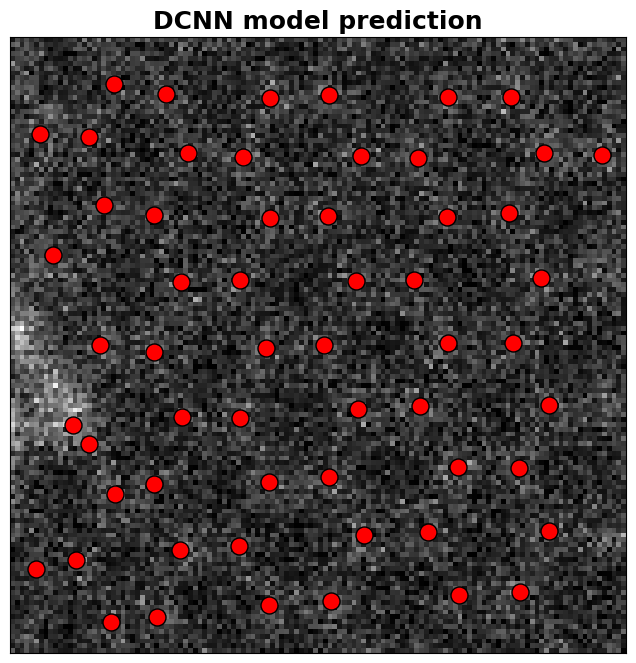

In [ ]:
x = coordinates[0][:, 1]
y = coordinates[0][:, 0]
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(test_img[0:128,0:128], cmap='gist_gray')

imglab = ax.scatter(x, y,  marker='o', c="r" , s = 150 ,cmap='coolwarm', edgecolor='k')
plt.title('DCNN model prediction' , fontsize = 18, fontweight = "bold")
ax.set_xticks([])
ax.set_yticks([])

## RDW performance

In [ ]:
def apply_log_one(min_sigma, max_sigma, threshold, overlap):

    #img = imgdata_noisy
    img = test_img[0:128,0:128]
    preprocessed_img = norm2d(np.array(img))
    array_3d = preprocessed_img[None, :, :]

    num_sigma = 10
    window_size = 10

    # Initialize arrays for results
    coordinates = np.zeros((1, 3))
    coms = np.zeros((1, 3))
    imstack_grid = np.zeros((1, window_size, window_size, 1))

    # Process the preprocessed image
    imglist = [0]  # Assuming you're processing a single image in this case
    for i in imglist:
        img_to_analyze = norm2d(array_3d[i])  # Apply norm2d to the slice from array_3d

        # Apply LoG filter to detect atoms using the provided parameters
        all_atoms = feature.blob_log(preprocessed_img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=num_sigma, threshold=threshold, overlap=overlap)

        if len(all_atoms) == 0:
            return np.array([]), 0

        coordinate = np.full_like(all_atoms, i)
        coordinate[:, :-1] = all_atoms[:, :-1]

        # Attempt to extract sub-images around detected atoms
        try:
            imstack, com, frames = aoi.utils.extract_subimages(img_to_analyze, coordinate[:, :-1], window_size)
            com = np.array(com)
            if com.size == 0:  # Check if the 'com' array is empty
                continue  # Skip the rest of the loop if no sub-images were extracted

            com_ = np.full((len(com), 3), i)
            com_[:, :-1] = com
            imstack = (imstack - imstack.min()) / (imstack.max() - imstack.min())  # Normalize sub-images

            # Accumulate results
            coms = np.concatenate((coms, com_), axis=0)
            coordinates = np.concatenate((coordinates, coordinate), axis=0)
            imstack_grid = np.concatenate((imstack_grid, imstack), axis=0)
        except ValueError as e:
            print(f"Error processing image index {i}: {e}")
            continue  # Optionally log the error and skip this iteration

    # Remove the initial placeholder row
    coordinates = coordinates[1:]
    coms = coms[1:]
    imstack_grid = imstack_grid[1:]

    return coms, len(coms)

**Quality Function: Objective 1**

The Quality_count function is designed to evaluate the performance Laplacian of Gaussian method in atom detection based on a comparison between the number of atoms detected by the apply_log function and a pre-established number of atoms drived from materials lattice structure.



Define Oracle based on the material's unit cell size

In [ ]:
def calculate_total_points(image, unit_cell_length, unit_cell_width, atoms_per_unit_cell):

    # Get the dimensions of the cropped and normalized image
    image_height, image_width = image.shape

    # Calculate the image area
    image_area = image_width * image_height

    # Calculate the unit cell area
    unit_cell_area = unit_cell_length * unit_cell_width

    # Determine the number of unit cells in the image
    number_of_unit_cells = image_area / unit_cell_area

    # Multiply by the number of atoms per unit cell
    total_points = (number_of_unit_cells * atoms_per_unit_cell)*1.1
    total_points = math.floor(total_points)
    return total_points

In [ ]:
unit_cell_length = 42
unit_cell_width = 42
atoms_per_unit_cell = 6
Oracle = calculate_total_points(test_img[0:128,0:128], unit_cell_length, unit_cell_width, atoms_per_unit_cell)
print(Oracle)

61


In [ ]:
def Quality_count(params):
    min_sigma, max_sigma, threshold, overlap = params
    coms, log_count = apply_log_one(min_sigma, max_sigma, threshold, overlap)

    difference = abs((log_count - Oracle)/Oracle)

    return difference

**Error Function: Objective 2**

Identifies false positives in atom detection by calculating the sum of distances between neighboring atoms and normalizing the result based on a threshold relative to lattice parameters.

Sum of distances to the nearest neighbors: 35.95


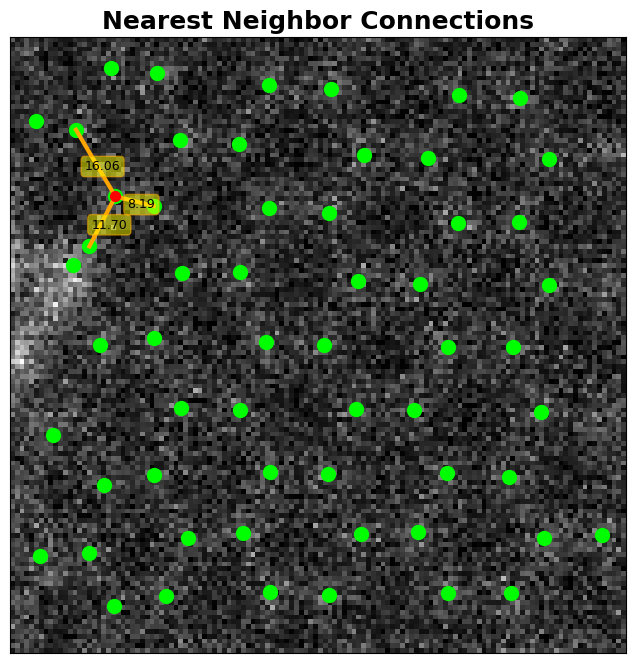

In [ ]:
coms = coordinates[0][:,:-1]

# Use NearestNeighbors from scikit-learn to find the 3 nearest neighbors
nbrs = NearestNeighbors(n_neighbors=4, algorithm='ball_tree').fit(coms)

# Find the distances and indices of the 3 nearest neighbors for each atom
distances, indices = nbrs.kneighbors(coms)

# Exclude the first column (distance to the point itself)
nearest_distances = distances[:, 1:]
nearest_indices = indices[:, 1:]

# Plot the atom coordinates
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(test_img[0:128,0:128], cmap='gist_gray')
ax.scatter(coms[:, 1], coms[:, 0], s=100, c='lime')

# Randomly select a point within the defined area
selected_point_index = random.choice(range(len(coms)))
selected_point = coms[selected_point_index]

# Highlight the selected point
ax.scatter(selected_point[1], selected_point[0], s=50, c='red', zorder=5)

# Draw lines to the four nearest neighbors and annotate them with the distances
for i, neighbor_index in enumerate(nearest_indices[selected_point_index]):
    neighbor_point = coms[neighbor_index]
    line = ax.plot([selected_point[1], neighbor_point[1]], [selected_point[0], neighbor_point[0]], 'orange', linewidth=3, zorder=3)

    # Get the middle of the line to place the text
    mid_point = [(selected_point[1] + neighbor_point[1]) / 2, (selected_point[0] + neighbor_point[0]) / 2]

    # Annotate the line with distance
    ax.annotate(f"{nearest_distances[selected_point_index, i]:.2f}",
                mid_point,
                textcoords="offset points",
                xytext=(5,-5),
                ha='center',
                fontsize=9,
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='orange', facecolor='yellow', alpha=0.5))

ax.set_title('Nearest Neighbor Connections', fontsize=18, fontweight='bold')
ax.set_xticks([])
ax.set_yticks([])

# Sum of the distances to the 3 nearest neighbors for the selected point
sum_of_nearest_distances = np.sum(nearest_distances[selected_point_index])
print(f"Sum of distances to the nearest neighbors: {sum_of_nearest_distances:.2f}")

# Configure the tick parameters
ax.invert_yaxis()
plt.show()

In [ ]:
lattice_param_limit = sum_of_nearest_distances+(sum_of_nearest_distances)*10/100
lattice_param_limit

39.54968680673272

In [ ]:
def Error_count(params):
    min_sigma, max_sigma, threshold, overlap = params

    # Assume apply_log is defined elsewhere and returns coordinates and log_count
    coms, log_count = apply_log_one(min_sigma, max_sigma, threshold, overlap)

    # Safeguard for n_neighbors to not exceed number of samples
    n_neighbors = min(len(coms), 4)  # Ensure n_neighbors does not exceed the number of samples in coms

    # Calculate the sum of distances to the nearest neighbors for each point
    if n_neighbors > 1:  # Proceed only if there are at least 2 points (1 neighbor besides itself)
        nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(coms)
        distances, _ = nbrs.kneighbors(coms)
        sum_of_distances = np.sum(distances[:, 1:], axis=1)  # Exclude the distance to itself (first column)
    else:
        sum_of_distances = np.array([0] * len(coms))  # If only 1 sample, the sum of distances is 0

    # Count points with the sum of distances below a certain threshold
    points_below_threshold = np.sum(sum_of_distances < lattice_param_limit)

    normalized_points = points_below_threshold / Oracle  # Assuming Oracle_A is defined and non-zero


    return normalized_points

**Multi-Objective Optimization**

The provided funcrions define and execute a multi-objective optimization problem using the **NSGA-II** algorithm. The main goal of this optimization is to minimize two objectives (Error_count, and Quality_count) by adjusting certain hyper-parameters (threshold, overlap).

In [ ]:
# Define your problem as a class inheriting from Problem
class MyOptimizationProblem(Problem):
    def __init__(self):
        # Initialize the problem with 4 decision variables and 2 objectives
        super(MyOptimizationProblem, self).__init__(4, 2)
        self.types[:] = [Real(1, 15), Real(15,30), Real(0.01, 0.1), Real(0.01, 1.0)]

        self.directions[:] = [Problem.MINIMIZE, Problem.MINIMIZE]  # Assuming both objectives are to be minimized

    def evaluate(self, solution):
        #min_sigma, max_sigma, threshold, overlap = solution.variables
        min_sigma, max_sigma, threshold, overlap = solution.variables

        error = Error_count([min_sigma, max_sigma, threshold, overlap])
        quality = Quality_count([min_sigma, max_sigma, threshold, overlap])

        #Ensure the objectives are returned as a list or array of two values
        solution.objectives[:] = [error, quality]

In [ ]:
problem = MyOptimizationProblem()

# Solve the problem using the NSGA-II algorithm
algorithm = NSGAII(problem)

algorithm.run(10)  # Adjust the number of iterations as needed

# After the run, you can extract the Pareto-optimal solutions
for solution in algorithm.result:
    print(f"Objectives: {solution.objectives}, Parameters: {solution.variables}")

Objectives: [0.0, 1.0], Parameters: [9.988526444210473, 25.149282981675828, 0.05251044098626335, 0.4908104143239014]
Objectives: [0.5901639344262295, 0.06557377049180328], Parameters: [2.7910604973177975, 20.313841746855395, 0.02224688074539473, 0.52869122473766]
Objectives: [0.0, 1.0], Parameters: [10.330759154915619, 19.14992241657205, 0.02190784525168127, 0.3287831128175355]
Objectives: [0.0, 1.0], Parameters: [7.118776585388845, 26.039056517402614, 0.04084919234117175, 0.03006796717728813]
Objectives: [0.0, 0.4918032786885246], Parameters: [4.713636199187323, 16.33543207682319, 0.03643597078160245, 0.03358071054511521]
Objectives: [0.0, 1.0], Parameters: [13.585195160138067, 16.495902171904586, 0.05398304811366657, 0.7890086354120182]
Objectives: [0.0, 1.0], Parameters: [12.396467705510444, 22.98201343041987, 0.051198553643428124, 0.8931875043512322]
Objectives: [0.0, 0.5081967213114754], Parameters: [4.725201215537318, 17.06262911433644, 0.03749304698297471, 0.0373840210098816]
Ob

Pareto front olutions

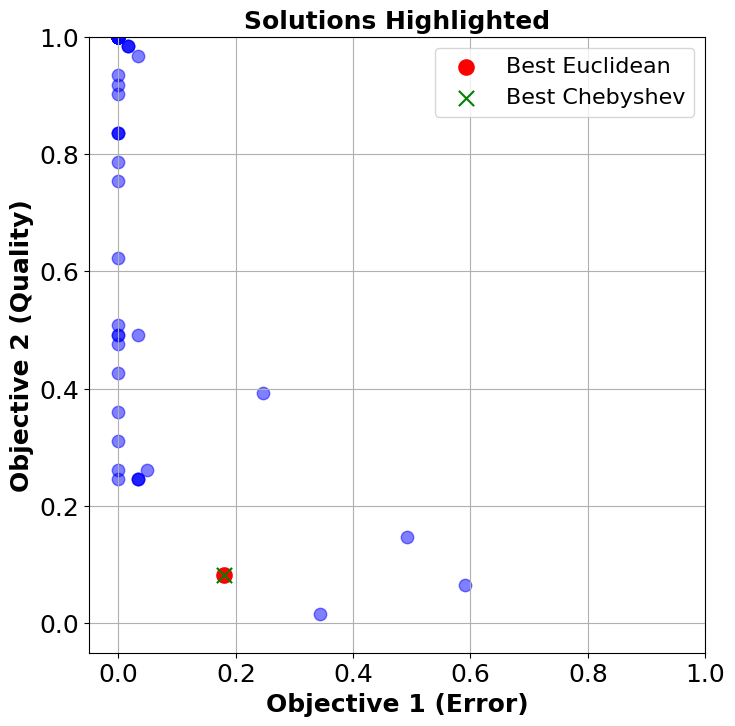

In [ ]:
# Given: solutions and objectives extraction from your algorithm's result
solutions = algorithm.result
objectives = [s.objectives[:] for s in solutions]

# Define your ideal point here
ideal_point = [0, 0]  # Replace ideal_obj1 and ideal_obj2 with your ideal values

# Calculate distances
euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives]
chebyshev_distances = [np.max(np.abs(np.array(obj) - np.array(ideal_point))) for obj in objectives]

# Find the best solutions based on distances
best_solution_euclidean_index = np.argmin(euclidean_distances)
best_solution_chebyshev_index = np.argmin(chebyshev_distances)

# Separate objectives for plotting
obj1 = [o[0] for o in objectives]
obj2 = [o[1] for o in objectives]

fig = plt.figure(figsize=(8, 8))

# Create scatter plot of the Pareto front
plt.scatter(obj1, obj2, s=80, marker='o', c="blue", alpha=0.5)
plt.scatter(obj1[best_solution_euclidean_index], obj2[best_solution_euclidean_index], color='red', label='Best Euclidean' , alpha=1, s = 120)
plt.scatter(obj1[best_solution_chebyshev_index], obj2[best_solution_chebyshev_index], color='green', label='Best Chebyshev', alpha=1, marker='x', s = 120)
# Create scatter plot

# Adding plot labels and title
plt.title('Solutions Highlighted', fontsize = 18, fontweight = "bold")
plt.xlabel('Objective 1 (Error)', fontsize = 18, fontweight = "bold")
plt.ylabel('Objective 2 (Quality)', fontsize = 18, fontweight = "bold")
plt.grid(True)
plt.tick_params(axis='both', which='major', labelsize=18)

plt.xlim([-0.05, 1])  # Replace xmin and xmax with your desired values
plt.ylim([-0.05, 1])
plt.legend(prop={'size': 16})
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

LoG* performance

In [ ]:
solutions[best_solution_euclidean_index]

# Retrieve the best solutions based on Euclidean and Chebyshev distances
best_solution_euclidean = solutions[best_solution_euclidean_index]
best_solution_chebyshev = solutions[best_solution_chebyshev_index]

# Extract the parameters from these solutions
best_parameters_euclidean = best_solution_euclidean.variables
best_parameters_chebyshev = best_solution_chebyshev.variables

# Print the best parameters for each method
print("Best Parameters based on Euclidean Distance:", best_parameters_euclidean)
print("Best Parameters based on Chebyshev Distance:", best_parameters_chebyshev)

Best Parameters based on Euclidean Distance: [2.7741072256380046, 19.569836848101197, 0.03669853389396739, 0.859941805864306]
Best Parameters based on Chebyshev Distance: [2.7741072256380046, 19.569836848101197, 0.03669853389396739, 0.859941805864306]


In [ ]:
coms, _  = apply_log_one(best_parameters_euclidean[0],
                               best_parameters_euclidean[1],
                               best_parameters_euclidean[2],
                               best_parameters_euclidean[3])

<ipython-input-31-53f686ab0eb1>:6: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  imglab = ax.scatter(coms[:, 1], coms[:, 0], c="cyan", s=150, cmap='coolwarm', edgecolor='k')


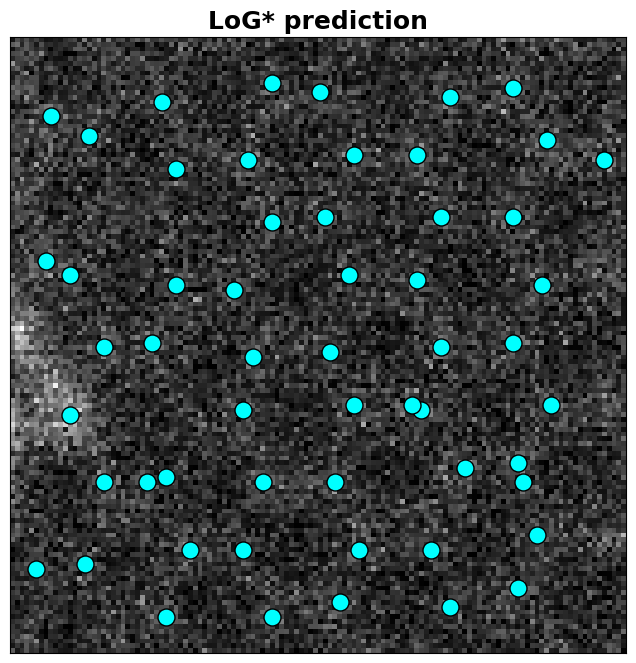

In [ ]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(test_img[0:128,0:128], cmap='gist_gray')

# Scatter plot with filtered data
imglab = ax.scatter(coms[:, 1], coms[:, 0], c="cyan", s=150, cmap='coolwarm', edgecolor='k')
plt.title('LoG* prediction' , fontsize = 18, fontweight = "bold")

ax.set_xticks([])
ax.set_yticks([])
plt.show()

# Sliding Transform

In [ ]:
def apply_log_slides(image, min_sigma, max_sigma, threshold, overlap):

    #img = imgdata_noisy
    img = image
    preprocessed_img = norm2d(np.array(img))
    array_3d = preprocessed_img[None, :, :]

    num_sigma = 10
    window_size = 10

    # Initialize arrays for results
    coordinates = np.zeros((1, 3))
    coms = np.zeros((1, 3))
    imstack_grid = np.zeros((1, window_size, window_size, 1))

    # Process the preprocessed image
    imglist = [0]  # Assuming you're processing a single image in this case
    for i in imglist:
        img_to_analyze = norm2d(array_3d[i])  # Apply norm2d to the slice from array_3d

        # Apply LoG filter to detect atoms using the provided parameters
        all_atoms = feature.blob_log(preprocessed_img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=num_sigma, threshold=threshold, overlap=overlap)

        if len(all_atoms) == 0:
            return np.array([]), 0

        coordinate = np.full_like(all_atoms, i)
        coordinate[:, :-1] = all_atoms[:, :-1]

        # Attempt to extract sub-images around detected atoms
        try:
            imstack, com, frames = aoi.utils.extract_subimages(img_to_analyze, coordinate[:, :-1], window_size)
            com = np.array(com)
            if com.size == 0:  # Check if the 'com' array is empty
                continue  # Skip the rest of the loop if no sub-images were extracted

            com_ = np.full((len(com), 3), i)
            com_[:, :-1] = com
            imstack = (imstack - imstack.min()) / (imstack.max() - imstack.min())  # Normalize sub-images

            # Accumulate results
            coms = np.concatenate((coms, com_), axis=0)
            coordinates = np.concatenate((coordinates, coordinate), axis=0)
            imstack_grid = np.concatenate((imstack_grid, imstack), axis=0)
        except ValueError as e:
            print(f"Error processing image index {i}: {e}")
            continue  # Optionally log the error and skip this iteration

    # Remove the initial placeholder row
    coordinates = coordinates[1:]
    coms = coms[1:]
    imstack_grid = imstack_grid[1:]

    return coms, len(coms)

In [ ]:
def remove_background(image, radius):

    # Convert to grayscale if it's a colored image
    if len(image.shape) == 3:
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        image_gray = image

    # Step 1: Apply FFT
    f = np.fft.fft2(image_gray)
    fshift = np.fft.fftshift(f)

    # Step 2: Create a circular mask to remove the low-frequency components
    rows, cols = image_gray.shape
    crow, ccol = rows // 2, cols // 2  # Center of the image

    def create_circular_mask(h, w, center=None, radius=None):
        if center is None:  # use the middle of the image
            center = [int(w/2), int(h/2)]
        if radius is None:  # use the smallest distance between the center and image walls
            radius = min(center[0], center[1], w-center[0], h-center[1])

        Y, X = np.ogrid[:h, :w]
        dist_from_center = np.sqrt((X - center[0])**2 + (Y - center[1])**2)

        mask = dist_from_center <= radius
        return mask

    # Apply the mask to the FFT shifted image
    circular_mask = create_circular_mask(rows, cols, center=[ccol, crow], radius=radius)
    fshift_filtered = fshift * circular_mask

    # Step 3: Inverse FFT to get the image back
    f_ishift = np.fft.ifftshift(fshift_filtered)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)

    # Calculate the magnitude spectrum of the masked FFT
    magnitude_spectrum_filtered = 50 * np.log(np.abs(fshift_filtered) + 1)

    return img_back, magnitude_spectrum_filtered

In [ ]:
def extract_subimages_modified(image, step_size, window_size):
    subimages_target = []
    coms_target = []

    img_height, img_width = image.shape
    window_height, window_width = window_size

    for y in range(0, img_height - window_height + 1, step_size):
        for x in range(0, img_width - window_width + 1, step_size):
            # Extract subimage
            subimage = image[y:y + window_height, x:x + window_width]
            subimages_target.append(subimage)

            # Calculate the center of mass for the subimage
            center_y = y + window_height // 2
            center_x = x + window_width // 2
            coms_target.append((center_y, center_x))

    return np.array(subimages_target), np.array(coms_target)

(36, 256, 256)
(36, 2)


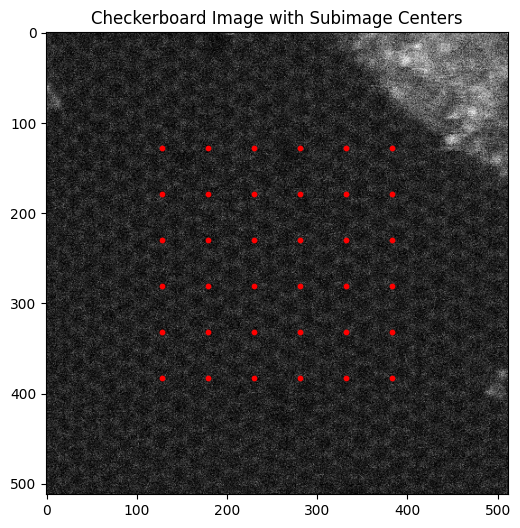

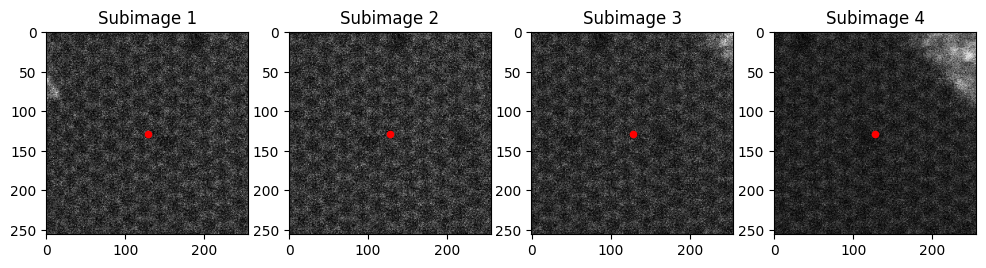

In [ ]:
# Sample image
image = exp_img[0:512, 0:512]
window_size = (256, 256)

# Calculate stride for 80% overlap
step_size = int(0.2 * window_size[0])

# Extract subimages and centers
subimages, positions = extract_subimages_modified(image, step_size, window_size)
print(subimages.shape)
print(positions.shape)
# Plot the original image with the centers marked
plt.figure(figsize=(6, 6))
plt.imshow(image, cmap='gray')
plt.scatter(positions[:, 1], positions[:, 0], c='r', marker='o', s = 10
            )
plt.title('Checkerboard Image with Subimage Centers')
plt.show()

# Plot a few example subimages with their centers
fig, axes = plt.subplots(1, 4, figsize=(12, 3))
for i, ax in enumerate(axes):
    ax.imshow(subimages[i], cmap='gray')
    ax.scatter(window_size[1] // 2, window_size[0] // 2, c='r', marker='o', s = 20)
    ax.set_title(f'Subimage {i+1}')
plt.show()

Remove all the backgronds

In [ ]:
# Example usage with a list of images
radius = 24  # Set the desired radius
subimages_list = []
magnitude_spectrums = []

for i in range(len(subimages)):
    result_image, magnitude_spectrum = remove_background(subimages[i], radius)
    subimages_list.append(result_image)
    magnitude_spectrums.append(magnitude_spectrum)

Calculate total points for the cropped and normalized image

In [ ]:
unit_cell_length = 42
unit_cell_width = 42
atoms_per_unit_cell = 6
Oracle = calculate_total_points(subimages[0], unit_cell_length, unit_cell_width, atoms_per_unit_cell)
print(Oracle)

245


**Optimizate for different slides**

In [ ]:
class MyOptimizationProblem(Problem):
    def __init__(self, image):
        super(MyOptimizationProblem, self).__init__(4, 2)  # Assuming 4 decision variables and 2 objectives
        self.image = image

        self.types[:] = [Real(1, 10), Real(8, 15), Real(0.01, 0.5), Real(0.5, 1.0)]

        self.directions[:] = [Problem.MINIMIZE, Problem.MINIMIZE]

    def evaluate(self, solution):
        min_sigma, max_sigma, threshold, overlap = solution.variables

        error = Error_count([min_sigma, max_sigma, threshold, overlap], self.image)
        quality = Quality_count([min_sigma, max_sigma, threshold, overlap], self.image)

        solution.objectives[:] = [error, quality]

In [ ]:
def Error_count(params, image):

    min_sigma, max_sigma, threshold, overlap = params

    # Assume apply_log is defined elsewhere and returns coordinates and log_count
    coms, log_count = apply_log_slides(image, min_sigma, max_sigma, threshold, overlap)

    # Safeguard for n_neighbors to not exceed number of samples
    n_neighbors = min(len(coms), 4)  # Ensure n_neighbors does not exceed the number of samples in coms

    # Calculate the sum of distances to the nearest neighbors for each point
    if n_neighbors > 1:  # Proceed only if there are at least 2 points (1 neighbor besides itself)
        nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(coms)
        distances, _ = nbrs.kneighbors(coms)
        sum_of_distances = np.sum(distances[:, 1:], axis=1)  # Exclude the distance to itself (first column)
    else:
        sum_of_distances = np.array([0] * len(coms))  # If only 1 sample, the sum of distances is 0

    # Count points with the sum of distances below a certain threshold
    points_below_threshold = np.sum(sum_of_distances < lattice_param_limit)

    normalized_points = points_below_threshold / Oracle  # Assuming Oracle_A is defined and non-zero


    return normalized_points

In [ ]:
def Quality_count(params, image):
    min_sigma, max_sigma, threshold, overlap = params
    coms, log_count = apply_log_slides(image, min_sigma, max_sigma, threshold, overlap)

    difference = abs((log_count - Oracle)/Oracle)

    return difference

In [ ]:
best_results = []  # List to store the best results for each image

for image in subimages:

    problem = MyOptimizationProblem(image)
    algorithm = NSGAII(problem)
    algorithm.run(10)  # Run the optimization algorithm
    solutions = algorithm.result  # Gather all solutions

    # Collect objectives from all solutions and calculate Euclidean distances
    objectives = [s.objectives[:] for s in solutions]
    ideal_point = [0, 0]  # Define your ideal point here
    euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives]
    best_solution_index = np.argmin(euclidean_distances)  # Find the index of the best solution
    best_solution = solutions[best_solution_index]  # Select the best solution based on the minimum distance

    # Extract the best log_count and len_coms from the best solution
    coms, log_count = apply_log_slides(image, *best_solution.variables)  # Ensure variables are unpacked correctly

    # Store the best parameters, objectives, and log_count
    best_results.append({
        'best_parameters': best_solution.variables,
        'best_objectives': best_solution.objectives,
        'log_count': log_count,
        'coms': coms
    })

    # Optionally print the best parameters and their corresponding results
    print("Best Parameters for current image:", best_solution.variables)
    print("Objectives:", best_solution.objectives)
    print("Log count:", log_count)
    #print("coms:", coms)

# Optionally, display or save the collected best results
print("All best results:", best_results)

In [ ]:
log_counts = [result['log_count'] for result in best_results]
best_parameters = [result['best_parameters'] for result in best_results]
best_objectives = [result['best_objectives'] for result in best_results]
best_coms = [result['coms'] for result in best_results]

In [ ]:
best_parameters = np.array(best_parameters)
best_parameters.shape

(36, 4)

In [ ]:
image = exp_img[0:512, 0:512]

window_size = (256, 256)

subimage_size = (int(0.2 * window_size[0]), int(0.2 * window_size[0]))

grid_height = (image.shape[0] - subimage_size[0]) // subimage_size[0] + 1
grid_width = (image.shape[1] - subimage_size[1]) // subimage_size[1] + 1

param_images = [np.full((grid_height, grid_width), np.nan) for _ in range(4)]

# Fill the grids with the best parameters
for (x, y), params in zip(positions, best_parameters):
    grid_x = x // subimage_size[0]
    grid_y = y // subimage_size[1]
    for i in range(4):
        param_images[i][grid_x, grid_y] = params[i]

# Check the param_image grids
# for i in range(4):
#     print(f"param_image[{i}] shape: {param_images[i].shape}")
#     print(f"param_image[{i}]: {param_images[i]}")

# Define parameter names
param_names = ['min_sigma', 'max_sigma', 'overlap', 'threshold']

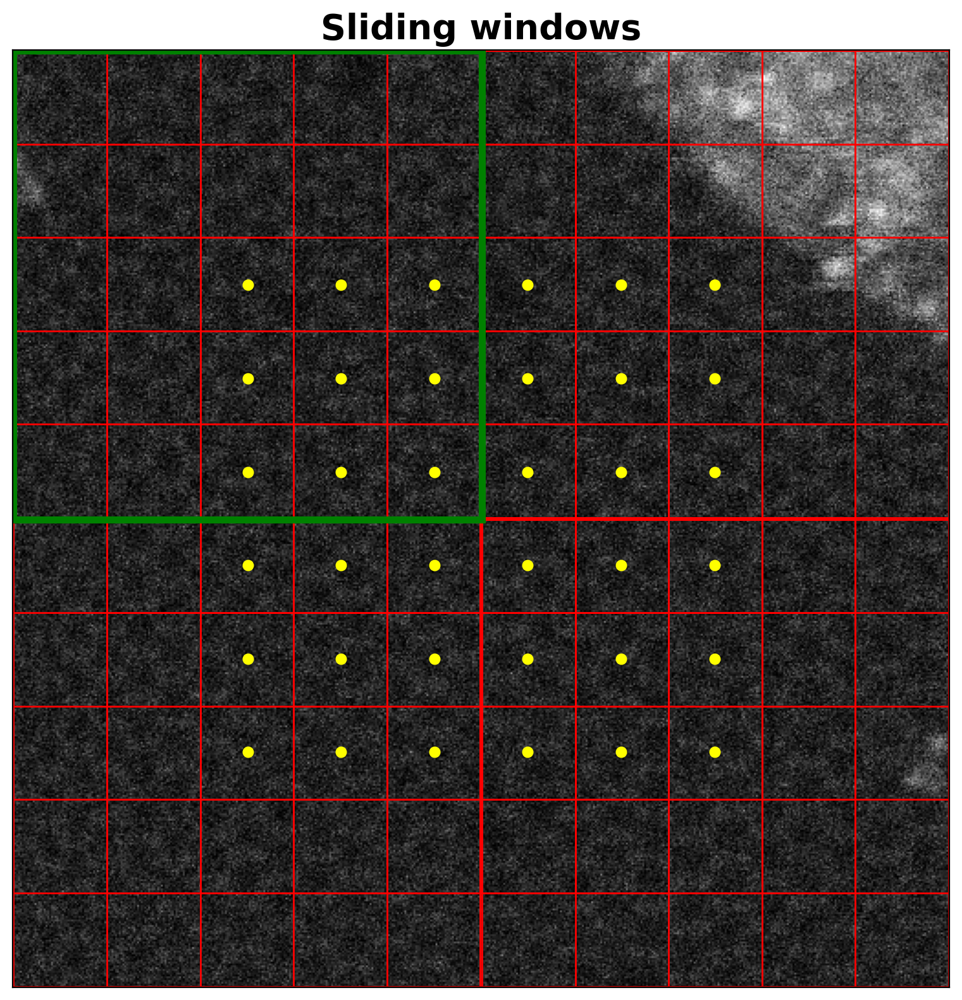

In [ ]:
plt.figure(figsize=(8, 8), dpi=200)
plt.imshow(image, cmap='gray')
plt.title('Sliding windows', fontsize = 20 , fontweight = "bold")

# Assuming `window_size` represents the actual size of the windows
for i, (x, y) in enumerate(positions):
    # Calculate the top-left corner of the window based on the center position
    top_left_x = x - window_size[0] // 2
    top_left_y = y - window_size[1] // 2

    # Highlight one specific window in green, the rest in red
    if i == 0:  # Choose one of the windows, e.g., the first one
        rect = plt.Rectangle((top_left_y, top_left_x), window_size[1], window_size[0],
                             edgecolor='green', facecolor='none', linewidth=4, zorder=2)
    else:
        rect = plt.Rectangle((top_left_y, top_left_x), window_size[1], window_size[0],
                             edgecolor='red', facecolor='none', zorder=1)
    plt.gca().add_patch(rect)

# Add yellow dots at the positions and ensure they are on top
plt.scatter(positions[:, 1], positions[:, 0], c='yellow', s=30, marker='o', label='Centers', zorder=3)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()


**best_parameters maps**

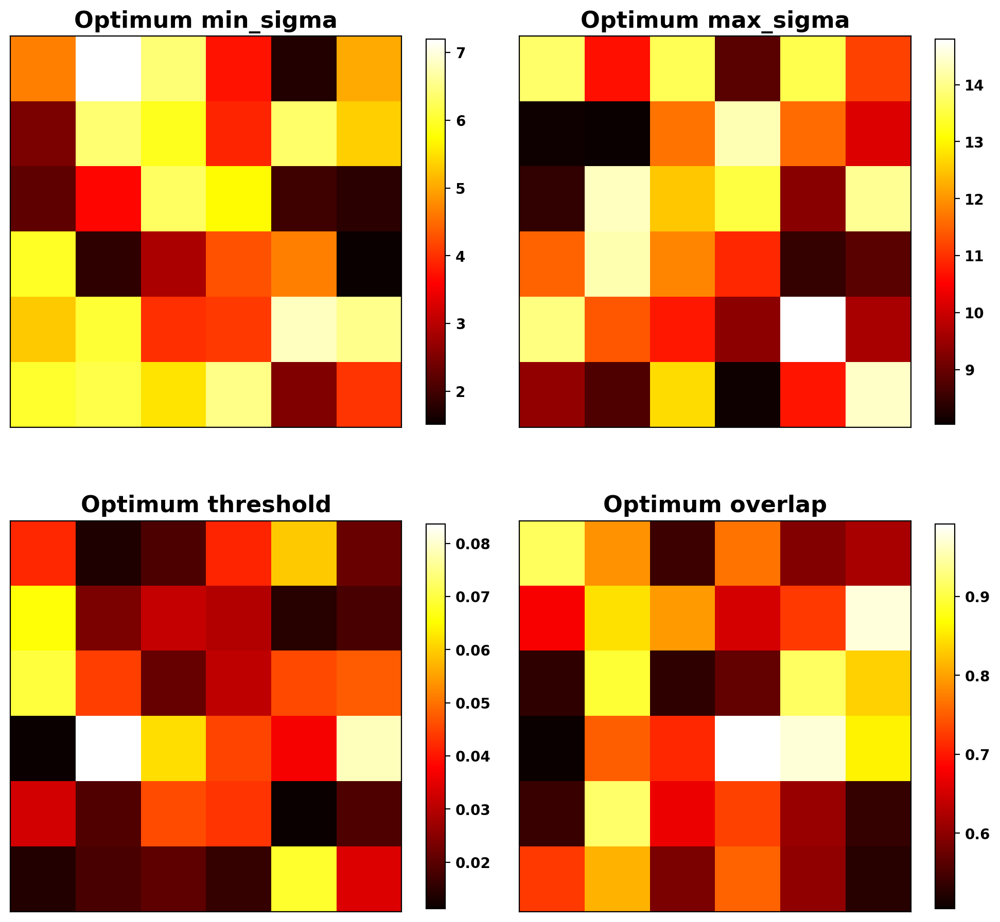

In [ ]:
best_parameters = np.array(best_parameters)
# Determine grid dimensions based on the number of subimages (36 in this case)
num_subimages = subimages.shape[0]
num_rows = math.isqrt(num_subimages)  # Take the integer square root to get the number of rows
num_cols = (num_subimages + num_rows - 1) // num_rows  # Calculate the number of columns to fit all subimages

# Reshape the best_parameters to match the layout of the subimages grid
best_parameters = best_parameters.reshape((num_rows, num_cols, 4))

# Plot heatmaps for each hyperparameter
fig, axes = plt.subplots(2, 2, figsize=(10, 10), dpi=200)

# Titles for each hyperparameter
titles = ['Optimum min_sigma', 'Optimum max_sigma', 'Optimum threshold', 'Optimum overlap']

for i, ax in enumerate(axes.flat):
    heatmap = best_parameters[:, :, i]  # Extract the i-th hyperparameter for all subimages
    cax = ax.imshow(heatmap, cmap='hot', interpolation='nearest')
    ax.set_title(titles[i], fontsize=16, fontweight="bold")

    # Create colorbar with bold ticks
    colorbar = fig.colorbar(cax, ax=ax, shrink=0.75)
    colorbar.ax.tick_params(labelsize=10, labelcolor='black')  # Change tick label size and color

    # Set the fontweight of the tick labels to bold
    for label in colorbar.ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_xticks([])
    ax.set_yticks([])

# Adjust layout and show the heatmaps
plt.tight_layout()
plt.show()


# Benchmarking LoG* **Noise**

Define noise image

In [ ]:
image = exp_img[0:512, 0:512]

np.random.seed(42) # for reproducibility
# Add noise to data
imgdata_noisy = image + np.random.normal(scale=0.04, size=image.shape)

In [ ]:
# Define part of the image use want to simulate noise on
start_row, end_row = 0, 128
start_col, end_col = 0, 128

In [ ]:
def simulate_noise_on_image(image):

    nn_outputs = []
    coordinates_list = []
    normalized_gauss_noise_levels = []  # List to store the normalized noise levels
    img_noise_list = []  # List to store the image noises for each level

    total_range = 1000
    step_size = 100

    # Number of steps in the loop
    num_steps = total_range // step_size + 1  # +1 to include the endpoint

    # Loop over the desired Gaussian noise levels, normalized
    for i in range(num_steps):
        # Normalize the current step (i) to a value between 0 and 1
        normalized_gauss_noise_level = i / (num_steps - 1)

        # Scale the normalized value back to the original range for actual noise level
        gauss_noise_level = int(normalized_gauss_noise_level * total_range)

        # Update the data transform object with the scaled noise level
        imaug = datatransform(
            dim_order_in='channel_last', dim_order_out='channel_first',
            gauss_noise=[gauss_noise_level, gauss_noise_level + 1],  # Use the scaled noise level
            squeeze_channels=True, seed=42)

        # Run the augmentation with the dummy 'targets'
        img_Noise, _ = imaug.run(image[None], np.zeros([1, image.shape[0], image.shape[1], 1]))

        # Use the model to predict on the augmented image section
        nn_output, coordinates = model.predict(img_Noise[0, 0, start_row:end_row, start_col:end_col])

        # Store the results
        nn_outputs.append(nn_output)
        coordinates_list.append(coordinates[0])
        normalized_gauss_noise_levels.append(normalized_gauss_noise_level)  # Save the normalized level
        img_noise_list.append(img_Noise)

    return nn_outputs, coordinates_list, normalized_gauss_noise_levels, img_noise_list

DCNN model

In [ ]:
nn_outputs, coordinates_list, normalized_gauss_noise_levels, img_noise_list = simulate_noise_on_image(image[0:128, 0:128])

Batch 1/1
1 image was decoded in approximately 0.0777 seconds
Batch 1/1
1 image was decoded in approximately 0.08 seconds
Batch 1/1
1 image was decoded in approximately 0.0763 seconds
Batch 1/1
1 image was decoded in approximately 0.0741 seconds
Batch 1/1
1 image was decoded in approximately 0.0755 seconds
Batch 1/1
1 image was decoded in approximately 0.077 seconds
Batch 1/1
1 image was decoded in approximately 0.0782 seconds
Batch 1/1
1 image was decoded in approximately 0.0751 seconds
Batch 1/1
1 image was decoded in approximately 0.0749 seconds
Batch 1/1
1 image was decoded in approximately 0.0774 seconds
Batch 1/1
1 image was decoded in approximately 0.0772 seconds


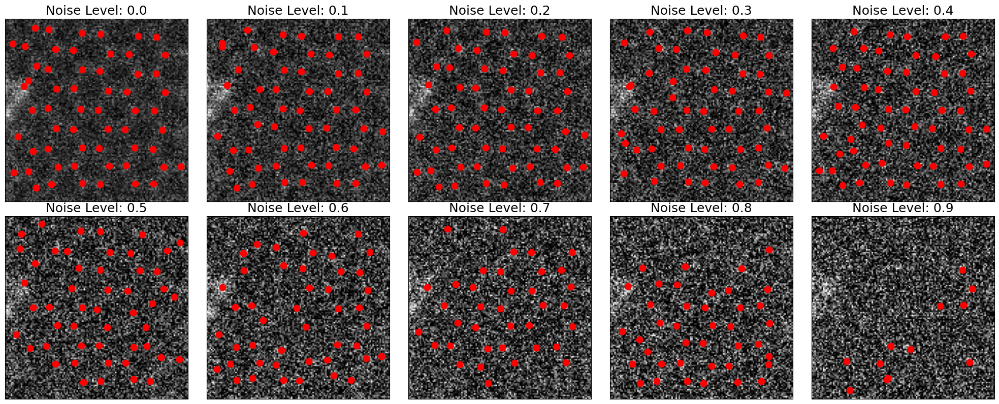

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, ax in enumerate(axes.flatten()):
    if i < len(coordinates_list):
        x = coordinates_list[i][:, 1]  # All rows, first column
        y = coordinates_list[i][:, 0]  # All rows, second column

        # Display the image
        ax.imshow(img_noise_list[i][0, 0, 0:256, 0:256], cmap='gist_gray')

        # Scatter plot of coordinates on the image
        ax.scatter(x, y, marker='o', c="r", s=80)

        # Remove x and y ticks
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks

        # Inverting y-axis to match image coordinates
        ax.invert_yaxis()

        # Setting title to indicate the noise level
        ax.set_title(f'Noise Level: {normalized_gauss_noise_levels[i]}', fontsize=18)
    else:
        ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()

**Define Oracle**

In [ ]:
unit_cell_length = 42
unit_cell_width = 42
atoms_per_unit_cell = 6
Oracle = calculate_total_points(test_img, unit_cell_length, unit_cell_width, atoms_per_unit_cell)
print(Oracle)

61


In [ ]:
cropped_images_noise_list = []

for image in img_noise_list:
# We check if there's an extra batch dimension and handle accordingly
    if image.ndim == 4:
        cropped_image = image
    elif image.ndim == 3:
        cropped_images_noise_list = image
    else:
        raise ValueError("Image dimensions are not compatible. Expected 3 or 4 dimensions, got {}".format(image.ndim))

    cropped_images_noise_list.append(cropped_image)

In [ ]:
cropped_images_noise_list[1].shape

(1, 1, 128, 128)

In [ ]:
squeezed_images = [np.squeeze(img) for img in cropped_images_noise_list]
squeezed_images[1].shape

(128, 128)

In [ ]:
subimage_slides = squeezed_images

In [ ]:
best_results = []  # List to store the best results for each image
times = []  # List to store the times for each iteration

for image in subimage_slides:

    problem = MyOptimizationProblem(image)
    algorithm = NSGAII(problem)
    algorithm.run(10)  # Run the optimization algorithm
    solutions = algorithm.result  # Gather all solutions

    # Collect objectives from all solutions and calculate Euclidean distances
    objectives = [s.objectives[:] for s in solutions]
    ideal_point = [0, 0]  # Define your ideal point here
    euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives]
    best_solution_index = np.argmin(euclidean_distances)  # Find the index of the best solution
    best_solution = solutions[best_solution_index]  # Select the best solution based on the minimum distance

    # Extract the best log_count and len_coms from the best solution
    coms, log_count = apply_log_slides(image, *best_solution.variables)  # Ensure variables are unpacked correctly

    # Store the best parameters, objectives, and log_count
    best_results.append({
        'best_parameters': best_solution.variables,
        'best_objectives': best_solution.objectives,
        'log_count': log_count,
        'coms': coms
    })

    # Optionally print the best parameters and their corresponding results
    print("Best Parameters for current image:", best_solution.variables)
    print("Objectives:", best_solution.objectives)
    print("Log count:", log_count)

# Optionally, display or save the collected best results
print("All best results:", best_results)

Best Parameters for current image: [1.4096861990822995, 11.061828438589929, 0.09326165662036749, 0.971011718164992]
Objectives: [0.22950819672131148, 0.45901639344262296]
Log count: 33
Best Parameters for current image: [4.612224929250506, 10.555407485868898, 0.013435456065057005, 0.8398576461318961]
Objectives: [0.3770491803278688, 0.22950819672131148]
Log count: 47
Best Parameters for current image: [3.4117671126800735, 8.865225994457298, 0.04598781375218068, 0.9180446031670605]
Objectives: [0.26229508196721313, 0.3114754098360656]
Log count: 42
Best Parameters for current image: [3.6634033968778636, 14.144187254415359, 0.04582939117967996, 0.5334544747646701]
Objectives: [0.21311475409836064, 0.3442622950819672]
Log count: 40
Best Parameters for current image: [5.641099908070533, 12.754397907537644, 0.01967569753663888, 0.6538432467025024]
Objectives: [0.04918032786885246, 0.45901639344262296]
Log count: 33
Best Parameters for current image: [2.1823943097483096, 10.12795914557788, 0

In [ ]:
log_counts = [result['log_count'] for result in best_results]
best_parameters = [result['best_parameters'] for result in best_results]
best_objectives = [result['best_objectives'] for result in best_results]
best_coms = [result['coms'] for result in best_results]

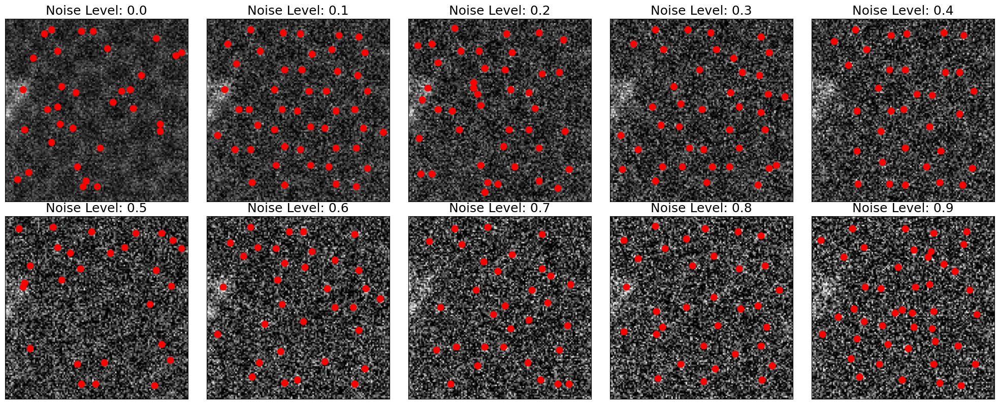

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, ax in enumerate(axes.flatten()):
    if i < len(best_coms):
        x = best_coms[i][:, 1]  # All rows, first column
        y = best_coms[i][:, 0]  # All rows, second column

        # Display the image
        ax.imshow(img_noise_list[i][0, 0, 0:256, 0:256], cmap='gist_gray')

        # Scatter plot of coordinates on the image
        ax.scatter(x, y, marker='o', c="r", s=80)

        # Remove x and y ticks
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks

        # Inverting y-axis to match image coordinates
        ax.invert_yaxis()

        # Setting title to indicate the noise level
        ax.set_title(f'Noise Level: {normalized_gauss_noise_levels[i]}', fontsize=18)
    else:
        ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()

# Benchmarking LoG* **Time**

In [ ]:
def extract_subimages(image, subimage_size, num_subimages, seed):
    np.random.seed(seed)  # Set the random seed for reproducibility
    height, width = image.shape
    positions = set()
    subimage_slides = []

    while len(positions) < num_subimages:
        x = np.random.randint(0, height - subimage_size[0] + 1)
        y = np.random.randint(0, width - subimage_size[1] + 1)
        pos = (x, y)
        if pos not in positions:
            positions.add(pos)
            subimage = image[x:x + subimage_size[0], y:y + subimage_size[1]]
            subimage_slides.append(subimage)

    return subimage_slides

In [ ]:
def apply_model_to_subimages(subimage_slides):
    nn_outputs = []
    coordinates_list = []
    image_indices = []
    timing_list = []  # Initialize an empty list to store timing information

    for idx, image in enumerate(subimage_slides):
        # Start timing for this operation
        st = time.time()

        # Use the model to predict on the subimage
        nn_output, coordinates = model.predict(image)

        # Stop timing and calculate elapsed time
        sf = time.time()
        elapsed_time = sf - st
        timing_list.append(elapsed_time)

        # Store the results
        nn_outputs.append(nn_output)
        coordinates_list.append(coordinates)
        image_indices.append(idx)

    coordinates_list = [list(d.values())[0] for d in coordinates_list]

    return nn_outputs, coordinates_list, subimage_slides, image_indices, timing_list

## DCNN TRAINING

Load train/test data (this is a simple dataset generated just from a single image)

In [ ]:
dataset = np.load("Hex_train_test3.npz")
images = dataset["X_train"]
labels = dataset["y_train"]
images_test = dataset["X_test"]
labels_test = dataset["y_test"]

In [ ]:
print(images.shape, labels.shape)
print(images_test.shape, labels_test.shape)

(1280, 1, 256, 256) (1280, 256, 256)
(320, 1, 256, 256) (320, 256, 256)


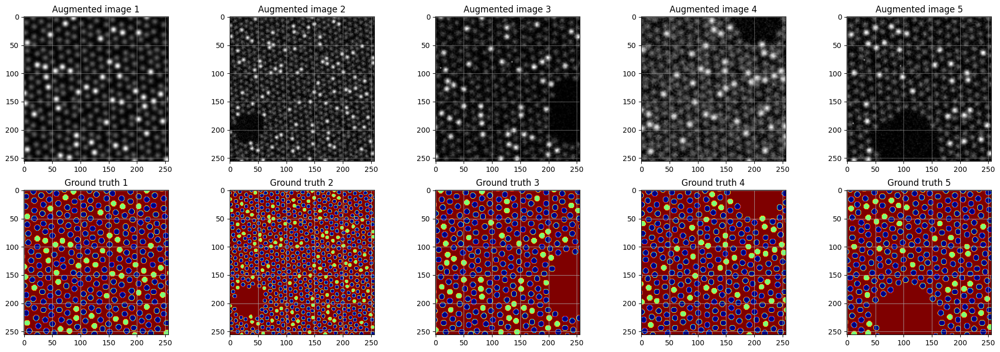

In [ ]:
n = 5 # number of images to plot

n = n + 1
fig = plt.figure( figsize=(30, 8))
for i in range(1, n):
    ax = fig.add_subplot(2, n, i)
    ax.imshow(images[i-1,0,:,:], cmap='gray')
    ax.set_title('Augmented image ' + str(i))
    ax.grid(alpha = 0.5)
    ax = fig.add_subplot(2, n, i+n)
    ax.imshow(labels[i-1], interpolation='Gaussian', cmap='jet')
    ax.set_title('Ground truth ' + str(i))
    ax.grid(alpha=0.75)

In [ ]:
model = aoi.models.Segmentor(nb_classes=3)

/usr/local/lib/python3.10/dist-packages/atomai/trainers/trainer.py:667: UserWarning: No GPU found. The training can be EXTREMELY slow
  warnings.warn(


In [ ]:
#print(model.net)

Model Training Time

**On GPU**

Epoch 1/300 ... Training loss: 1.116 ... Test loss: 1.1329 ... Train Accuracy: 0.1559 ... Test Accuracy: 0.088 ... GPU memory usage: N/A / N/A
Epoch 100/300 ... Training loss: 0.1612 ... Test loss: 0.1614 ... Train Accuracy: 0.9116 ... Test Accuracy: 0.898 ... GPU memory usage: N/A / N/A
Epoch 200/300 ... Training loss: 0.1315 ... Test loss: 0.1048 ... Train Accuracy: 0.8991 ... Test Accuracy: 0.9189 ... GPU memory usage: N/A / N/A
Epoch 300/300 ... Training loss: 0.1081 ... Test loss: 0.0855 ... Train Accuracy: 0.9124 ... Test Accuracy: 0.9219 ... GPU memory usage: N/A / N/A
Model (final state) evaluation loss: 0.0977
Model (final state) accuracy: 0.9127
Performing stochastic weight averaging...
Model (final state) evaluation loss: 0.0936
Model (final state) accuracy: 0.9208
Plotting training history


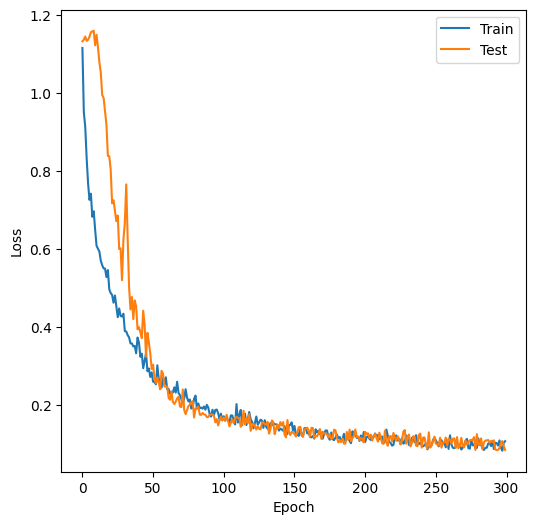

In [ ]:
# Start the timer
start_time = time.time()

# Train the model
model.fit(images, labels, images_test, labels_test,  # training data
          training_cycles=300, compute_accuracy=True, swa=True  # training parameters
          )

# End the timer
end_time = time.time()

# Calculate the total training time
Total_training_time_DCNN = end_time - start_time

We check the DCNN model to predict the atoms coordinates of 256*256 subimages

In [ ]:
#plt.imshow(test_img)

(10, 256, 256)


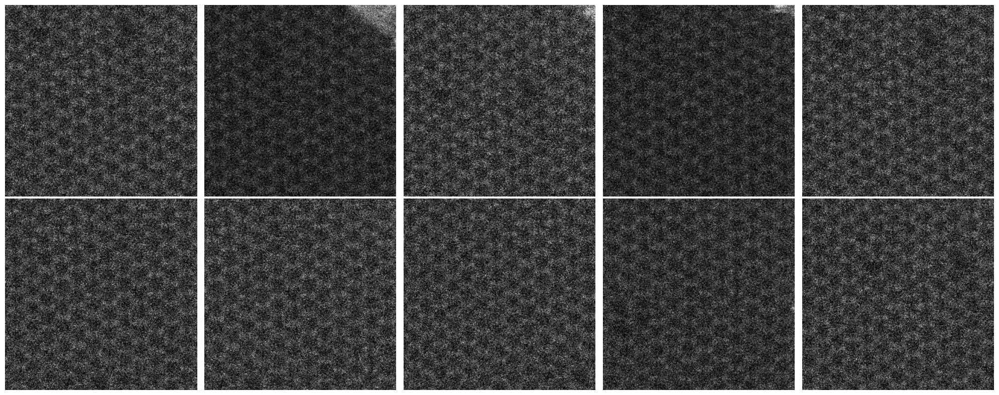

In [ ]:
# Example usage with a dummy image
image = exp_img[0:512, 0:512]
subimage_size=(256, 256)
num_subimages=10
seed=42
subimage_slides = extract_subimages(image, subimage_size, num_subimages, seed)

subimage_slides = np.array(subimage_slides)
print(subimage_slides.shape)

# Display the subimages
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for i, subimage in enumerate(subimage_slides):
    axes[i].imshow(subimage, cmap='gray')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
nn_outputs, coordinates_list, subimage_slides, image_indices, timing_list = apply_model_to_subimages(subimage_slides)

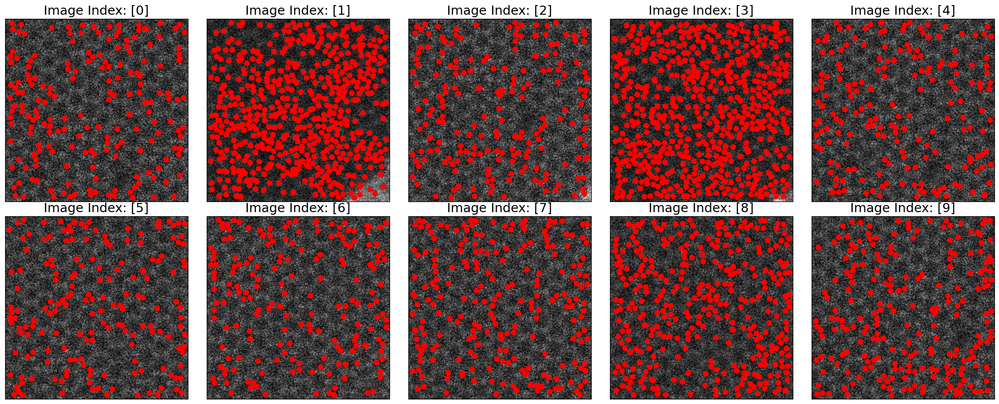

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, ax in enumerate(axes.flatten()):
    if i < len(coordinates_list):
        x = coordinates_list[i][:, 1]  # All rows, first column
        y = coordinates_list[i][:, 0]  # All rows, second column

        # Display the image
        ax.imshow(subimage_slides[i], cmap='gist_gray')

        # Scatter plot of coordinates on the image
        ax.scatter(x, y, marker='o', c="r", s=50)

        # Remove x and y ticks
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks

        # Inverting y-axis to match image coordinates
        ax.invert_yaxis()

        # Setting title to indicate the noise level
        ax.set_title(f'Image Index: {[i]}', fontsize=18)
    else:
        ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()

## RDW workflow Optimization

In [ ]:
best_results = []  # List to store the best results for each image
iteration_times = []  # List to store the times for each iteration
acquiring_times = []  # List to store the times for extracting log_count and len_coms
total_start_time = time.time()  # Start timing for the entire optimization process

for image in subimage_slides:
    start_time = time.time()  # Start timing for this iteration

    problem = MyOptimizationProblem(image)
    algorithm = NSGAII(problem)
    algorithm.run(10)  # Run the optimization algorithm
    solutions = algorithm.result  # Gather all solutions

    # Collect objectives from all solutions and calculate Euclidean distances
    objectives = [s.objectives[:] for s in solutions]
    ideal_point = [0, 0]  # Define your ideal point here
    euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives]
    best_solution_index = np.argmin(euclidean_distances)  # Find the index of the best solution
    best_solution = solutions[best_solution_index]  # Select the best solution based on the minimum distance

    # Timing for extracting the best log_count and len_coms
    acquiring_start_time = time.time()
    coms, log_count = apply_log_slides(image, *best_solution.variables)  # Ensure variables are unpacked correctly
    acquiring_time = time.time() - acquiring_start_time
    acquiring_times.append(acquiring_time)

    # Calculate and store the total time taken for this iteration
    iteration_time = time.time() - start_time
    iteration_times.append(iteration_time)

    # Store the best parameters, objectives, and log_count
    best_results.append({
        'best_parameters': best_solution.variables,
        'best_objectives': best_solution.objectives,
        'log_count': log_count,
        'coms': coms
    })

    # Print the best parameters and their corresponding results for this iteration
    print(f"Best Parameters for current image: {best_solution.variables}")
    print(f"Objectives: {best_solution.objectives}")
    print(f"Log count: {log_count}")
    print(f"Time taken for acquiring best solution: {acquiring_time:.2f} seconds")
    print(f"Total time taken for this iteration: {iteration_time:.2f} seconds")

# Calculate the total optimization time for all images
total_optimization_time = time.time() - total_start_time

# Optionally, display or save the collected best results
print("All best results:", best_results)

# Calculate and display the average time for the iterations and acquiring
average_iteration_time = sum(iteration_times) / len(iteration_times)
average_acquiring_time = sum(acquiring_times) / len(acquiring_times)
print(f"Average time per iteration: {average_iteration_time:.2f} seconds")
print(f"Average time for acquiring best solution: {average_acquiring_time:.2f} seconds")
print(f"Total optimization time for all images: {total_optimization_time:.2f} seconds")


NameError: name 'apply_log_slides' is not defined

In [ ]:
acquiring_times = []
for image in subimage_slides:

    acquiring_start_time = time.time()
    coms, log_count = apply_log_slides(image, *best_solution.variables)  # Ensure variables are unpacked correctly
    acquiring_time = time.time() - acquiring_start_time
    acquiring_times.append(acquiring_time)

In [ ]:
log_counts = [result['log_count'] for result in best_results]
best_parameters = [result['best_parameters'] for result in best_results]
best_objectives = [result['best_objectives'] for result in best_results]
best_coms = [result['coms'] for result in best_results]

In [ ]:
acquiring_times = []
for image in subimage_slides:

    acquiring_start_time = time.time()
    coms, log_count = apply_log_slides(image, *best_solution.variables)  # Ensure variables are unpacked correctly
    acquiring_time = time.time() - acquiring_start_time
    acquiring_times.append(acquiring_time)

In [ ]:
# Generate example timing data for two methods
method_a_times = timing_list
method_b_times = iteration_times
Total_training_time_DCNN = 155.0888
#Total_training_time_DCNN = Total_training_time_DCNN
#Total_optimization_time_for_ten_images = 363.17
Total_optimization_time_for_ten_images = total_optimization_time
iteration_optimization_times_LoG = iteration_times
Inference_times_for_ten_LoG = acquiring_times
Inference_times_for_ten_DCNN= timing_list

In [ ]:
# Prepare the data as a dictionary
data = {
    'method_a_times': method_a_times,
    'method_b_times': iteration_times,
    'Total_training_time_DCNN': Total_training_time_DCNN,
    'Total_optimization_time_for_ten_images': Total_optimization_time_for_ten_images,
    'iteration_optimization_times_LoG': iteration_optimization_times_LoG,
    'Inference_times_for_ten_LoG': Inference_times_for_ten_LoG,
    'Inference_times_for_ten_DCNN': Inference_times_for_ten_DCNN
}

# Save the data to a pickle file
with open('timing_data.pkl', 'wb') as f:
    pickle.dump(data, f)

NameError: name 'method_a_times' is not defined

In [ ]:
with open('timing_data.pkl', 'rb') as f:
    loaded_data = pickle.load(f)

# Accessing the data
method_a_times = loaded_data['method_a_times']

FileNotFoundError: [Errno 2] No such file or directory: 'timing_data.pkl'

In [ ]:
# Function to format x-ticks
def scientific_notation_formatter(x, pos):
    return f'{x:.2e}'

# Consistent Legend Style
legend_style = {
    'loc': 'upper left',
    'frameon': True,
    'fancybox': True,
    'framealpha': 1,
    'borderpad': 1,
    'edgecolor': 'black',
    'labelspacing': 1,
    'fontsize': 20
}

# === Plot 1: Density Plot for Acquisition Times === #

# Generate density data for both methods
density_a = gaussian_kde(Inference_times_for_ten_DCNN)
density_b = gaussian_kde(Inference_times_for_ten_LoG)

# Calculate the minimum and maximum time values across both methods
start_time = min(min(Inference_times_for_ten_DCNN), min(Inference_times_for_ten_LoG))
end_time = max(max(Inference_times_for_ten_DCNN), max(Inference_times_for_ten_LoG))

# Avoid zero in logarithmic scale by ensuring start_time is positive
if start_time <= 0:
    start_time = 1e-3

# Create a range of time values to plot the densities, starting from the minimum to the maximum
time_values = np.logspace(np.log10(start_time), np.log10(end_time), 1000)

# Plot the density curves
plt.figure(figsize=(8, 8), dpi=100)
plt.plot(time_values, density_a(time_values), label='DCNN', color='blue', linewidth=2)
plt.plot(time_values, density_b(time_values), label='LoG', color='red', linewidth=2)

# Fill areas under the curves
plt.fill_between(time_values, density_a(time_values), alpha=0.3, color='blue')
plt.fill_between(time_values, density_b(time_values), alpha=0.3, color='red')

# Add labels and title
plt.title('Inference Time Distribution: DCNN vs LoG*', fontsize=20, fontweight='bold')
plt.xlabel('Time (seconds)', fontsize=20, fontweight='bold')
plt.ylabel('Density', fontsize=20, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.6)

# Set x-axis to logarithmic scale
plt.xscale('log')

# Set custom x-ticks and format them with scientific notation
plt.xticks(np.logspace(np.log10(start_time), np.log10(end_time), 3), fontsize=16)
plt.gca().xaxis.set_major_formatter(FuncFormatter(scientific_notation_formatter))

# Set y-ticks
plt.yticks(np.linspace(0, max(density_a(time_values)), 3), fontsize=16)

# Add legend with bold font and specific fontsize
plt.legend(loc='upper left', frameon=True, fancybox=True, framealpha=1, borderpad=1, edgecolor='black', labelspacing=1, handlelength=2)
plt.setp(plt.gca().get_legend().get_lines(), linewidth=3)

# Show the plot
plt.show()

# === Plot 2: Bar Chart for LoG Optimization vs DCNN Training === #

# Data preparation
log_times = iteration_optimization_times_LoG  # List of ten LoG optimization times
dcnn_time = Total_training_time_DCNN

# Calculate mean and standard deviation for LoG times
mean_log_time = np.mean(log_times)
std_log_time = np.std(log_times)

# Data for plotting
methods = [1, 2]  # Using 1 and 2 as the x labels
times = [mean_log_time, dcnn_time]
errors = [std_log_time, 0]  # No error bar for DCNN as it's a single value

# Create a figure
plt.figure(figsize=(8, 8), dpi=100)

# Create a bar chart with error bars
bars = plt.bar(methods, times, yerr=errors, width=0.6, capsize=20, color=['#56A3A6', '#e74c3c'], alpha=0.8, edgecolor='black', linewidth=1.5)

# Add timing values on top of the bars with enhanced font
for bar, time in zip(bars, times):
    plt.text(bar.get_x() + bar.get_width() / 2 , bar.get_height() + max(errors) * 1.5, f'{time:.2f} sec',
             ha='center', va='bottom', fontsize=16, fontweight='bold', color='black')

# Set limits and labels
plt.ylim(0, max(times) * 1.1)
plt.ylabel('Time (seconds)', fontsize=20, fontweight='bold')
plt.xlabel('Methods', fontsize=20, fontweight='bold')

# Make x-ticks bold and y-ticks normal
plt.xticks([1, 2], labels=['1', '2'], fontsize=16)
plt.tick_params(axis='y', which='major', labelsize=16)
for tick in plt.gca().get_xticklabels():
    tick.set_fontweight('normal')
for tick in plt.gca().get_yticklabels():
    tick.set_fontweight('normal')

# Adjust legend style to be at the top left for the second plot
legend_style_left = legend_style.copy()
legend_style_left['loc'] = 'upper left'  # Move the legend to the top left

# Add legend with adjusted style matching the bar colors
plt.legend(bars, ['LoG*', 'DCNN'], **legend_style_left)

plt.title('LoG Optimization - DCNN Training', fontsize=20, fontweight='bold')

# Add consistent grid
plt.grid(axis='y', linestyle='--', linewidth=0.6, alpha=0.6)

# Show the plot
plt.tight_layout()
plt.show()


# Live data from instrument

In [ ]:
# General packages
import os, time, sys, math

# General image processing packages
from matplotlib import pyplot as plot
import numpy as np
import cv2 as cv
import sys
sys.path.append("/nfs/home/upratius/AE_sl_all/AE_proj/STEM_TF/Autoscript/autoscript_code_lib")
# the Autoscript packages
from autoscript_tem_microscope_client import TemMicroscopeClient
from autoscript_tem_microscope_client.enumerations import *
from autoscript_tem_microscope_client.structures import *
# Create microscope autoscript client and connect to the MPC

microscope = TemMicroscopeClient()
ip = "10.46.217.241"#--> velo computer
# ip = "10.46.217.242"# gatan computer
microscope.connect(ip, 9095)# 7521 on gatan computer
# microscope.connect(ip, port = 7522)# 7521 on velox  computer


In [ ]:
# Switch to STEM optical mode
st = time.time()
microscope.optics.optical_mode = OpticalMode.STEM

# Acquire microscope image from given scanning detector and show the image using matplotlib package
image = microscope.acquisition.acquire_stem_image(DetectorType.HAADF, 512, 32e-5)
img = image.data - np.min(image.data)
image_data = (255*(img/np.max(img))).astype(np.uint8)
np.savez("image_graphene.npz", img = image_data)
# plot the image
fig = plot.figure(figsize=(6,6))
plot.imshow(image_data, cmap='gray')
plot.title('Acquired image')
sf = time.time()
sf-st# 9 seconds to acquire

## Preprocessing

* Smooth the image
or
* Remove Background FFT
and
* Select the desired size


In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def remove_background_and_plot(image, radius):
    if len(image.shape) == 3:
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        image_gray = image

    # Apply FFT
    f = np.fft.fft2(image_gray)
    fshift = np.fft.fftshift(f)

    rows, cols = image_gray.shape
    crow, ccol = rows // 2, cols // 2

    def create_circular_mask(h, w, center=None, radius=None):
        if center is None:
            center = [int(w/2), int(h/2)]
        if radius is None:
            radius = min(center[0], center[1], w-center[0], h-center[1])

        Y, X = np.ogrid[:h, :w]
        dist_from_center = np.sqrt((X - center[0])**2 + (Y - center[1])**2)

        mask = dist_from_center <= radius
        return mask

    circular_mask = create_circular_mask(rows, cols, center=[ccol, crow], radius=radius)
    fshift_filtered = fshift * circular_mask

    f_ishift = np.fft.ifftshift(fshift_filtered)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)

    magnitude_spectrum_filtered = 1 * np.log(np.abs(fshift_filtered) + 1)

    # Plotting the results
    plt.figure(figsize=(12, 8))

    plt.subplot(131)
    plt.imshow(image_gray, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(img_back, cmap='gray')
    plt.title(f'Background Removed (Radius={radius})')
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(magnitude_spectrum_filtered, cmap='gray')
    plt.title('Magnitude Spectrum')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return img_back, magnitude_spectrum_filtered

In [ ]:
#realTime_img = image_data[0:128, 0:128]
realTime_img = exp_img[128:256, 128:256]
# Define Oracle
#realTime_img = apply_gaussian_smoothing(realTime_img, sigma=0.5)
plt.imshow(realTime_img)

In [ ]:
img_back, magnitude_spectrum_filtered = remove_background_and_plot(realTime_img, radius=6)

Define Oracle

In [ ]:
unit_cell_length = 42
unit_cell_width = 42
atoms_per_unit_cell = 6
Oracle = calculate_total_points(realTime_img, unit_cell_length, unit_cell_width, atoms_per_unit_cell)
print(Oracle)

Optimization

In [ ]:
problem = MyOptimizationProblem(img_back)
algorithm = NSGAII(problem)
algorithm.run(10)  # Run the optimization algorithm
solutions = algorithm.result  # Gather all solutions

# Collect objectives from all solutions and calculate Euclidean distances
objectives = [s.objectives[:] for s in solutions]
ideal_point = [0, 0]  # Define your ideal point here
euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives]
best_solution_index = np.argmin(euclidean_distances)  # Find the index of the best solution
best_solution = solutions[best_solution_index]  # Select the best solution based on the minimum distance

# Extract the best log_count and len_coms from the best solution
coms, log_count = apply_log_one(*best_solution.variables)  # Ensure variables are unpacked correctly

# Store the best parameters, objectives, and log_count
best_results.append({
    'best_parameters': best_solution.variables,
    'best_objectives': best_solution.objectives,
    'log_count': log_count,
    'coms': coms
})

In [ ]:
log_counts = [result['log_count'] for result in best_results]
best_parameters = [result['best_parameters'] for result in best_results]
best_objectives = [result['best_objectives'] for result in best_results]
best_coms = [result['coms'] for result in best_results]

Pareto Front Selection with Control parameters

In [ ]:
# Sample objectives for demonstration
objectives = [s.objectives[:] for s in solutions]
variables = [s.variables[:] for s in solutions]

# Create a scatter plot with Plotly for the Pareto front
fig = go.Figure()

# Add data points with default color (pinkish red)
for i, obj in enumerate(objectives):
    fig.add_trace(go.Scatter(
        x=[obj[0]], y=[obj[1]],
        mode='markers',
        marker=dict(size=14, color='rgba(255, 102, 102, 0.8)', line=dict(width=2, color='DarkSlateGrey')),  # Pinkish red color for points
        customdata=[i],  # Store index in customdata for retrieval on click
        text=f"Solution {i}",
        name=f"Solution {i}",
        opacity=1,  # Keep dots fully visible
    ))

# Set x and y axis limits
x_min, x_max = -0.05, 1  # Adjust these limits as needed
y_min, y_max = -0.05, 1  # Adjust these limits as needed

# Add dashed lines at x=0 and y=0 using shapes
fig.update_layout(
    shapes=[
        dict(type="line", x0=0, y0=y_min, x1=0, y1=y_max, line=dict(color="black", width=2, dash="dash"), layer="below"),  # Dashed line for x=0
        dict(type="line", x0=x_min, y0=0, x1=x_max, y1=0, line=dict(color="black", width=2, dash="dash"), layer="below")   # Dashed line for y=0
    ]
)

# Update layout and axes
fig.update_layout(
    title=dict(
        text="Pareto Front Solutions",
        font=dict(size=40, family='Arial', color='Black'),  # Adjust title font
        x=0.5,  # Center title
        y=0.92,  # Move title directly on the plot
        xanchor='center',
        yanchor='top'
    ),
    xaxis=dict(
        range=[x_min, x_max],
        title=dict(
            text="Objective 1",
            font=dict(size=40, family='Arial', color='Black')  # Correct way to set x-axis title font
        ),
        tickfont=dict(size=20),  # Control x-axis tick size
        showgrid=True,
        gridcolor='Black',
        gridwidth=0.5,  # Make grid lines thinner
        griddash='dot',  # Set grid lines as dotted
        zeroline=False,   # Turn off the default zero line to avoid conflict with custom dashed lines
        showline=True,  # Make the top and right axis lines visible
        linecolor='Black',
        linewidth=3,
        mirror=True  # Make sure top and right lines are visible
    ),
    yaxis=dict(
        range=[y_min, y_max],
        title=dict(
            text="Objective 2",
            font=dict(size=40, family='Arial', color='Black')  # Correct way to set y-axis title font
        ),
        tickfont=dict(size=20),  # Control y-axis tick size
        showgrid=True,
        gridcolor='Black',
        gridwidth=0.5,  # Make grid lines thinner
        griddash='dot',  # Set grid lines as dotted
        zeroline=False,   # Turn off the default zero line to avoid conflict with custom dashed lines
        showline=True,  # Make the right and top axis lines visible
        linecolor='Black',
        linewidth=3,
        mirror=True  # Mirror axis lines on the top and right
    ),
    plot_bgcolor='white',  # Remove background color
    paper_bgcolor='white',  # Remove the outer background color
    showlegend=False,
    hovermode='closest',
    autosize=False,
    width=800,  # Set the width of the figure
    height=800,  # Set the height of the figure
)

# Show the interactive plot
fig.show()


In [ ]:
# Prompt the user to enter the index of the selected point after inspecting the plot
selected_index = int(input("Enter the index of the selected solution: "))

for i, obj in enumerate(objectives):
    if i == selected_index:
        fig.data[i].marker.color = "cyan"  # Change the color of the selected point
        fig.data[i].marker.size = 20  # Increase the size of the selected marker
        fig.data[i].text = f'<b>Selected Solution<br>Obj1: {obj[0]:.3f}, Obj2: {obj[1]:.3f}<br>Sol {i}</b>'  # Bold the text using HTML
        fig.data[i].mode = 'markers+text'  # Ensure both markers and text are shown
        fig.data[i].textfont = dict(size=20)  # Larger text size
        fig.data[i].textposition = 'top right'  # Adjust the position of the text


fig.show()
# Adjust the width, height, and scale as needed

In [ ]:
# Prompt the user to enter the index of the selected point after inspecting the plot
selected_index = int(input("Enter the index of the selected solution: "))

# Retrieve the selected solution based on the index
selected_solution = solutions[selected_index]

# Extract the best log_count and len_coms from the selected solution
coms, log_count = apply_log_one(*selected_solution.variables)  # Ensure variables are unpacked correctly

# Store the best parameters, objectives, and log_count
best_results.append({
    'best_parameters': selected_solution.variables,
    'best_objectives': selected_solution.objectives,
    'log_count': log_count,
    'coms': coms
})

# Calculate and store the time taken for this iteration
iteration_time = time.time() - start_time
times.append(iteration_time)

# Print the selected solution's parameters and their corresponding results
print("Selected Parameters:", selected_solution.variables)
print("Objectives:", selected_solution.objectives)
print("Log count:", log_count)
print("Time taken for this iteration: {:.2f} seconds".format(iteration_time))
print("All best results:", best_results)

TEST the performance

In [ ]:
def apply_log_test(image, min_sigma, max_sigma, threshold, overlap):

    #img = imgdata_noisy
    img = test_img[0:128,0:128]
    preprocessed_img = norm2d(np.array(img))
    array_3d = preprocessed_img[None, :, :]

    num_sigma = 10
    window_size = 20

    # Initialize arrays for results
    coordinates = np.zeros((1, 3))
    coms = np.zeros((1, 3))
    imstack_grid = np.zeros((1, window_size, window_size, 1))

    # Process the preprocessed image
    imglist = [0]  # Assuming you're processing a single image in this case
    for i in imglist:
        img_to_analyze = norm2d(array_3d[i])  # Apply norm2d to the slice from array_3d

        # Apply LoG filter to detect atoms using the provided parameters
        all_atoms = feature.blob_log(preprocessed_img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=num_sigma, threshold=threshold, overlap=overlap)

        if len(all_atoms) == 0:
            return np.array([]), 0

        coordinate = np.full_like(all_atoms, i)
        coordinate[:, :-1] = all_atoms[:, :-1]

        # Attempt to extract sub-images around detected atoms
        try:
            imstack, com, frames = aoi.utils.extract_subimages(img_to_analyze, coordinate[:, :-1], window_size)
            com = np.array(com)
            if com.size == 0:  # Check if the 'com' array is empty
                continue  # Skip the rest of the loop if no sub-images were extracted

            com_ = np.full((len(com), 3), i)
            com_[:, :-1] = com
            imstack = (imstack - imstack.min()) / (imstack.max() - imstack.min())  # Normalize sub-images

            # Accumulate results
            coms = np.concatenate((coms, com_), axis=0)
            coordinates = np.concatenate((coordinates, coordinate), axis=0)
            imstack_grid = np.concatenate((imstack_grid, imstack), axis=0)
        except ValueError as e:
            print(f"Error processing image index {i}: {e}")
            continue  # Optionally log the error and skip this iteration

    # Remove the initial placeholder row
    coordinates = coordinates[1:]
    coms = coms[1:]
    imstack_grid = imstack_grid[1:]

    return coms, imstack_grid

In [ ]:
def Fit_GMM(imstack_grid, covariance_type, components):
    # Flatten the image stack grid and reduce its dimensionality
    flattened_imstack_grid = imstack_grid.reshape(imstack_grid.shape[0], -1)
    pca = PCA(n_components=2)  # Adjust based on your specific needs
    reduced_data = pca.fit_transform(flattened_imstack_grid)

    # First pass of GMM to estimate initial parameters
    preliminary_gmm = GaussianMixture(n_components=components, covariance_type=covariance_type, random_state=42)
    preliminary_gmm.fit(reduced_data)
    initial_means = preliminary_gmm.means_
    initial_weights = preliminary_gmm.weights_

    # Initialize and fit the GMM using the parameters from the preliminary GMM
    gmm = GaussianMixture(n_components=components, covariance_type=covariance_type,
                          means_init=initial_means, weights_init=initial_weights, random_state=42)
    gmm.fit(reduced_data)
    colors = gmm.predict(reduced_data)
    # Get the centroids (means) for each class
    centroids = gmm.means_

    return colors, reduced_data, centroids

In [ ]:
min_sigma, max_sigma, threshold, overlap = selected_solution.variables

image = img_back

coms, imstack_grid = apply_log_test(image, min_sigma, max_sigma, threshold, overlap)

**Clustering on the data**

In [ ]:
labels, reduced_data, centroids = Fit_GMM(imstack_grid, "full" , components = 3)

In [ ]:
plt.figure(figsize=(8, 8), dpi = 200)
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, s=20, cmap='coolwarm', edgecolor='k')
plt.title('GMM clustering all patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('Principal Component 1' , fontsize = 18, fontweight = "bold")
plt.ylabel('Principal Component 2' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True, linewidth=0.4)
plt.show()

In [ ]:
# Plotting
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(realTime_img, cmap='gist_gray')

# Scatter plot with filtered data
#imglab = ax.scatter(coms[:, 1], coms[:, 0], c=labels, s=100, cmap='coolwarm', edgecolor='k')
imglab = ax.scatter(coms[:, 1], coms[:, 0], c="lime", s=100, cmap='coolwarm', edgecolor='k')

plt.title('LoG* Prediction' , fontsize = 20, fontweight = "bold")

plt.xticks([])
plt.yticks([])
plt.show()

Define GMM clusters Centroids

In [ ]:
# Flatten the image patches for GMM
N, height, width, channels = imstack_grid.shape
data = imstack_grid.reshape(N, height * width)

# Fit the GMM
n_classes = 3  # Example number of classes, adjust as needed

# Initialize lists to store centroids and dispersions
centroids = []
dispersions = []

for i in range(n_classes):
    # Select patches belonging to class i
    class_patches = data[labels == i]

    # Calculate the centroid (mean image) for class i
    centroid = class_patches.mean(axis=0).reshape(height, width)
    centroids.append(centroid)

    # Calculate the dispersion (variance image) for class i
    dispersion = class_patches.var(axis=0).reshape(height, width)
    dispersions.append(dispersion)

# Visualize the centroid and dispersion images
fig, axes = plt.subplots(n_classes, 2, figsize=(5, 8), dpi=200)

for i in range(n_classes):
    # Display centroid image
    axes[i, 0].imshow(centroids[i], cmap='coolwarm')
    axes[i, 0].set_title(f'Centroid {i}', fontsize=12, fontweight="bold")
    axes[i, 0].axis('off')

    # Display dispersion image
    axes[i, 1].imshow(dispersions[i], cmap='coolwarm')
    axes[i, 1].set_title(f'Dispersion {i}', fontsize=12, fontweight="bold")
    axes[i, 1].axis('off')

# Adjust layout for better spacing
plt.tight_layout()

plt.show()
